# Data Generation

Throughout the first section of this tutorial, we will apply and demonstrate various SINDy methods on various forms of ODEs and PDEs. This notebook briefly introduces each equation, followed by a code demonstration of the equation and its visualization.

A summary of each ODE/PDE function and their corresponding visualization method is listed below.
<table>
  <thead>
    <tr>
      <th style="text-align:left">Type</th>
      <th style="text-align:left">Equation</th>
      <th style="text-align:left">Dimensions</th>
      <th style="text-align:left">Visualization Function</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td rowspan="4" style="vertical-align:top"><b>ODE</b></td>
      <td><a href="#chaotic-lorenz-equation">Chaotic Lorenz equation</a></td>
      <td>[3, <i>N<sub>t</sub></i>]</td>
      <td><code>visualize_ode_3d</code></td>
    </tr>
    <tr>
      <td><a href="#duffing-oscillator">Duffing oscillator</a></td>
      <td>[2, <i>N<sub>t</sub></i>]</td>
      <td><code>visualize_ode_2d</code></td>
    </tr>
    <tr>
      <td><a href="#van-der-pol-oscillator">Van der Pol oscillator</a></td>
      <td>[2, <i>N<sub>t</sub></i>]</td>
      <td><code>visualize_ode_2d</code></td>
    </tr>
    <tr>
      <td><a href="#f-8-crusader">F-8 Crusader</a></td>
      <td>[3, <i>N<sub>t</sub></i>]</td>
      <td><code>visualize_ode_3d</code></td>
    </tr>
    <tr>
      <td rowspan="5" style="vertical-align:top"><b>PDE</b></td>
      <td><a href="#inviscid-burgers-equation">Inviscid Burgers equation</a></td>
      <td>[<i>N<sub>x</sub></i>, <i>N<sub>t</sub></i>, 1]</td>
      <td><code>visualize_pde_1d</code></td>
    </tr>
    <tr>
      <td><a href="#kuramato-sivashinsky-pde">Kuramato-Sivashinsky PDE</a></td>
      <td>[<i>N<sub>x</sub></i>, <i>N<sub>t</sub></i>, 1]</td>
      <td><code>visualize_pde_1d</code></td>
    </tr>
    <tr>
      <td><a href="#korteweg-de-vries-pde">Korteweg de Vries PDE</a></td>
      <td>[<i>N<sub>x</sub></i>, <i>N<sub>t</sub></i>, 1]</td>
      <td><code>visualize_pde_1d</code></td>
    </tr>
    <tr>
      <td><a href="#2d-reaction-diffusion-equations">2D Reaction-Diffusion</a></td>
      <td>[<i>N<sub>x</sub></i>, <i>N<sub>y</sub></i>, <i>N<sub>t</sub></i>, 2]</td>
      <td><code>visualize_pde_2d</code></td>
    </tr>
    <tr>
      <td><a href="#shallow-water-equations">Shallow Water Equation</a></td>
      <td>[<i>N<sub>x</sub></i>, <i>N<sub>y</sub></i>, <i>N<sub>t</sub></i>, 3]</td>
      <td><code>visualize_pde_2d</code></td>
    </tr>
  </tbody>
</table>

In [1]:
# Import all required libraries

import numpy as np
import matplotlib.pyplot as plt

from sindy.odes import *
from sindy.pdes import *
from sindy.ivp_solvers import rk4
from sindy.plot_utils import \
    visualize_ode_2d, visualize_ode_3d, \
    visualize_pde_1d, visualize_pde_2d, \
    init_plt_format

init_plt_format()

# ODEs

Let us first introduce a helper function `generate_ode_data` which allows us to quickly generate the trajectories of a given ODE from a given initial condition. It utilizes the default ODE parameters and a [4th order Runge-Kutta solver](https://en.wikipedia.org/wiki/Runge%E2%80%93Kutta_methods) (RK4).

In [2]:
generate_ode_data?

Signature:
generate_ode_data(
    M: int,
    dt: float,
    x0: numpy.ndarray,
    ode: Callable,
    ode_params: list = [],
    ivp_solver: Callable = <function rk4 at 0x11ae2fd90>,
    noise_ratios: Optional[numpy.ndarray] = None,
) -> tuple
Docstring:
Function to generate time vector, as well as clean and noisy state data
using a given ODE function.

Args:
    M (int): Number of time points to generate.
    dt (float): Time step dt.
    x0 (np.ndarray): Initial conditions.
    ode (Callable): ODE function.
    ode_params (list): Parameters of the ODE function.
    ivp_solver (Callable): An initial value problem solver. Defaults to
        `rk4`.
    noise_ratios (Optional[np.ndarray]): List of noise ratios to generate.
        Defaults to None.

Returns:
    tuple[np.ndarray, np.ndarray, list[np.ndarray]]: Returns the time
        vector, clean x data, as well as a list of noisy x data.
File:      ~/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Imperial/Aero Eng/PhD/Research/

It also allows us to specify a list of $\sigma_{\text{NR}}$ in `noise_ratios` to introduce additive Gaussian noise into our data such that the measured state of $x(t)$ is defined as

$$ y(t) = x(t) + \epsilon $$

where $\epsilon$ is sampled from a zero-mean Guassian distribution. Following the noise definition of [(Messenger and Bortz, 2021)](https://epubs.siam.org/doi/abs/10.1137/20M1343166), its standard deviation is defined by

$$ \sigma = \sigma_{\text{NR}}\frac{||\mathbf{x}||_F}{\sqrt{MN}}, $$

where $\mathbf{x} \in \mathbb{R}^{M \times N}$. For any ODE data, the data array must be shaped `(m, n)`.


## Chaotic Lorenz Equation

In Edward Lorenz's [seminal work](https://www.whydoesriceplaytexas.com/wp-content/uploads/2017/04/Lorentz-JAS-Deterministic-nonperiodic-flow-1963.pdf), he derived a low order ODE system from a Rayleigh-Bénard convection flow, using truncated Fourier expansion. The derived system is defined by

$$
\begin{aligned}
    \dot{x} &= \sigma (y-x), \\
    \dot{y} &= x(\rho -z) - y, \\
    \dot{z} &= xy - \beta z,
\end{aligned}
$$

where the parameters that give rise to a chaotic strange attractor are $\sigma=10$, $\beta=8/3$ and $\rho=28$. In this equation, $x$ is proportional to convection intensity, $y$ is proportional to the temperature differences between ascending and descending currents, and $z$ is proportional to the distortion of the vertical temperature profile. Let us generate both a clean trajectory of the Lorenz system as well as one with additive Gaussian noise.

In [3]:
# Define noise ratio
noise_ratio = 0.05

# Define number of time steps and time step interval
M = 1000
dt = 0.01

# Define initial conditions
x0 = np.array([10, 10, 10])

# Generate both clean and noisy trajectories
t, x, noisy_x = generate_ode_data(
    M, dt, x0, lorenz, noise_ratios=[noise_ratio]
)

We may then visualize both clean and noisy data with `visualize_ode_3d`.

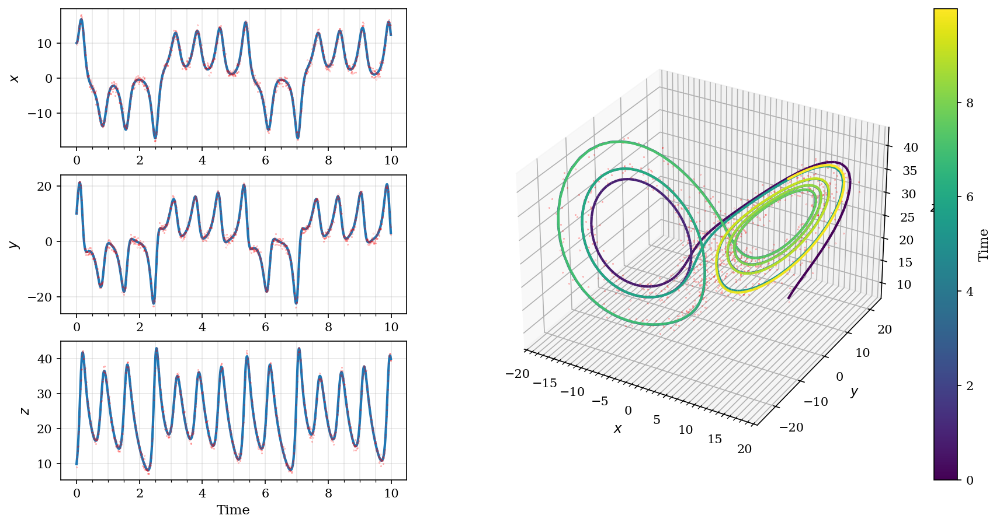

In [4]:
visualize_ode_3d(x, t, noisy_x[0])

Noisy data is represented as red dots that centre around clean trajectory. Different Lorenz parameters may also be used. The $\rho$ parameter is proportional to the Rayleigh number of the convective flow. Chaotic behavior is only exhibited in certain parameter regions. If we use $\rho=10$, then we obtain a system that stabilizes to an equilibrium point. A smaller $\rho$ value would result in a trajectory that decays to an equilibrium point.

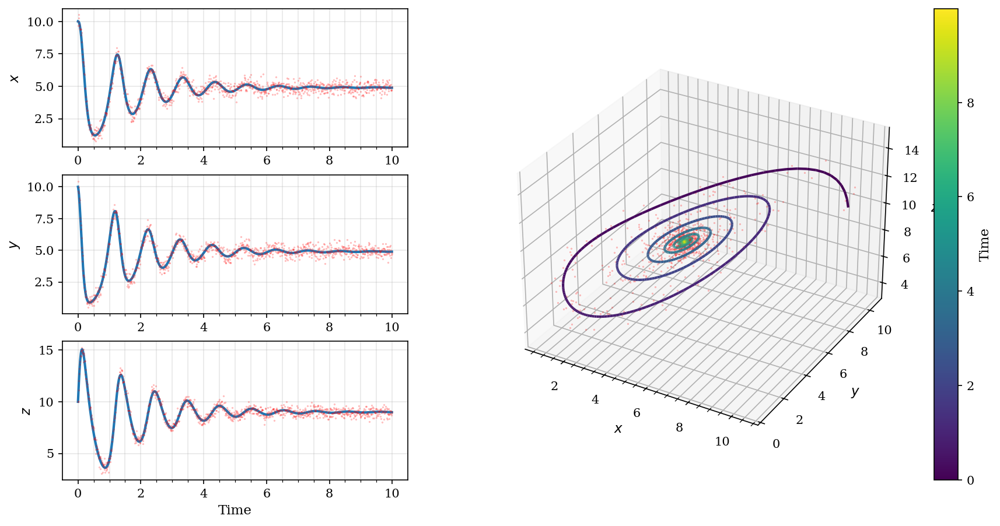

In [5]:
lorenz_params = [10, 8/3, 10]

t, x, noisy_x = generate_ode_data(
    M, dt, x0, lorenz, lorenz_params, noise_ratios=[noise_ratio]
)

visualize_ode_3d(x, t, noisy_x[0])

The bifurcation behavior can also be observed in a convective annulus flow setup as demonstrated in section 3 where further details can be found.

## Duffing Oscillator

The Duffing oscillator is a mass-spring-damper system where the spring has cubic nonlinear stiffness. The system is defined by

$$ \ddot{x} + \delta \dot{x} + \alpha x + \beta x^3 = 0, $$

or equivalently

$$
\mathbf{\dot{x}} = \mathbf{f}(\mathbf{x}) = 
\begin{bmatrix} 
    x_2 \\ 
    -\delta x_2 - \alpha x_1 - \beta x_1^3 
\end{bmatrix}.
$$

The parameters $\alpha$ and $\delta$ are proportional to the damping coefficient and linear spring stiffness respectively. Whereas, the parameter $\beta$ governs the hardening or softening behavior of the spring.

In [6]:
# Define number of time steps and time step interval
M = 5000
dt = 0.01

# Define initial conditions
x0 = np.array([10, 0])

t, x, noisy_x = generate_ode_data(
    M, dt, x0, duffing, noise_ratios=[noise_ratio]
)

The default parameters employed are $\delta = 0.2$, $\alpha = 0.05$ and $\beta = 1$. This results in a damped spring with hardening stiffness behavior. We may visualize the trajectory using `visualize_ode_2d`.

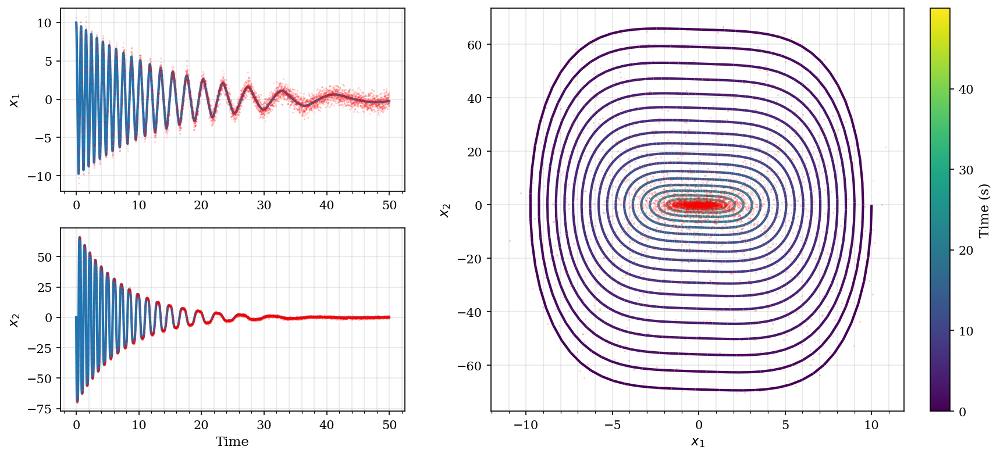

In [7]:
visualize_ode_2d(x, t, noisy_x[0])

## Van der Pol Oscillator

The Van der Pol oscillator is defined by

$$ \ddot{x} - \mu (1-x^2) \dot{x} + x = 0, $$

or equivalently

$$
\mathbf{\dot{x}} = \mathbf{f}(\mathbf{x})
= \begin{bmatrix}
    x_2 \\
    \mu(1 - x_1^2)x_2 - x_1
\end{bmatrix}.
$$

The parameter $\mu$ is defined as $0.5$ by default. The system undergoes a Hopf bifurcation at $\mu = 0$. If $\mu > 0$, the system exhibits negative damping near the origin; if $\mu < 0$ the system is locally stable and has a spiral source at the origin.

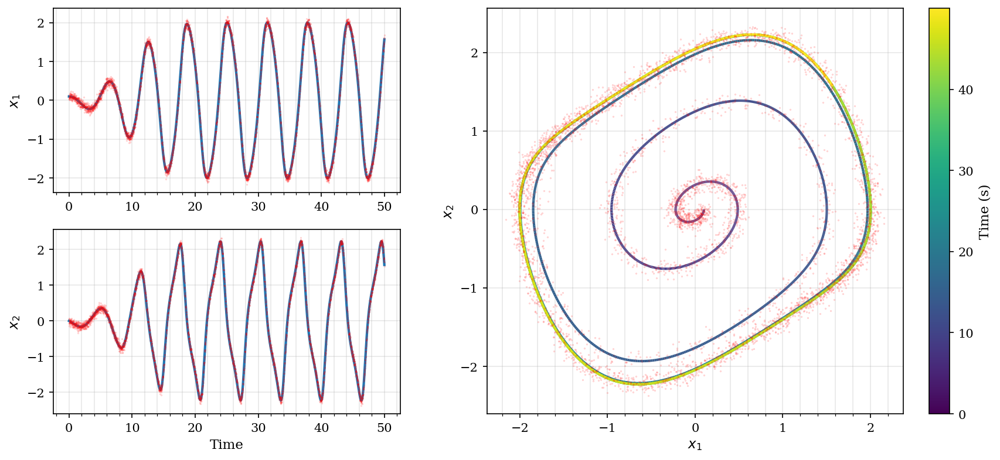

In [8]:
# Define number of time steps and time step interval
M = 5000
dt = 0.01

# Define initial conditions
x0 = np.array([0.1, 0])

# Generate data
t, x, noisy_x = generate_ode_data(
    M, dt, x0, van_der_pol, noise_ratios=[noise_ratio]
)

# Visualize data
visualize_ode_2d(x, t, noisy_x[0])

## F-8 Crusader

[(Garrard and Jordan, 1977)](https://www.sciencedirect.com/science/article/pii/000510987790070X) characterized the longitudinal flight dynamics of a F-8 Crusader at steady level flight condition of Mach = 0.85 and an altitude of 30,000 ft. The system has the states $\mathbf{x} = [\alpha, \theta, \dot{\theta}]^T$ which are angle of attack (rad), pitch rate (rad/s), pitch (rad) angle respectively. It also has a single elevator control input $\delta_E$ in radians. The system dynamics is defined by

$$
\begin{aligned}
    \dot{x}_1 &= -0.877x_1 + x_3 - 0.088x_1 x_3 + 0.47x_1^2 - 0.019x_2^2 - x_1^2 x_3 + 3.846x_1^3 - 0.215u + 0.28x_1^2 u + 0.47x_1 u^2 + 0.63u^3 \\
    \dot{x}_2 &= x_3 \\
    \dot{x}_3 &= -4.208x_1 - 0.396x_3 - 0.47x_1^2 - 3.564x_1^3 - 20.967u + 6.265x_1^2 u + 46x_1 u^2 + 61.1u^3.
\end{aligned}
$$

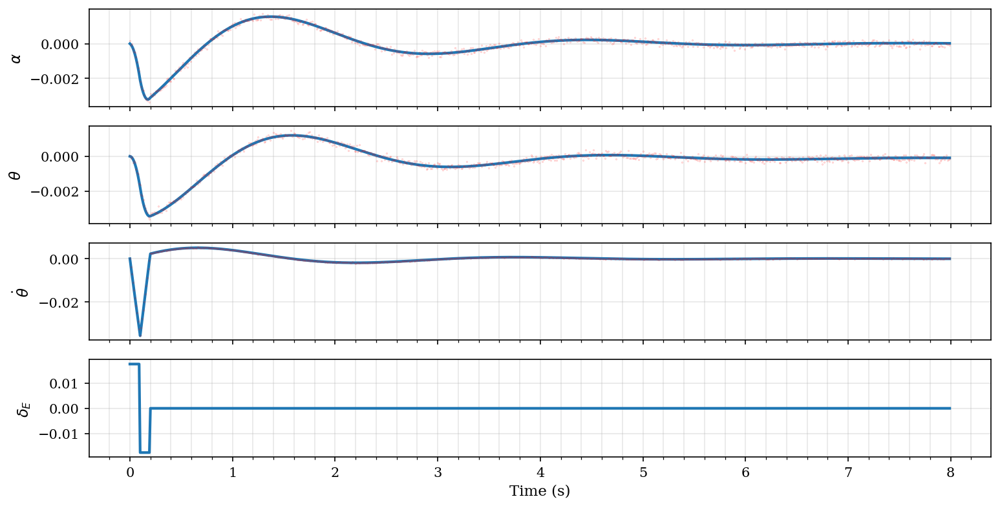

In [9]:
# Define an input function
u_func = lambda t: 2*np.deg2rad(1) * (t < 0.1) - np.deg2rad(1) * (t < 0.2)

# Define number of time steps and time step interval
M = 800
dt = 0.01

# Define initial conditions
x0 = np.array([0, 0, 0])

# Generate data
t, x, noisy_x = generate_ode_data(
    M, dt, x0, f8_crusader, [u_func], noise_ratios=[noise_ratio]
)

# Define state names for plot axis
state_names = [r'$\alpha$', r'$\theta$', r'$\dot{\theta}$']

# Visualize results
_, axs = plt.subplots(4, 1, sharex=True, figsize=(12,6))
for idx in range(3):
    axs[idx].plot(t, x[:, idx])
    axs[idx].plot(t, noisy_x[0][:, idx], 'r.', markersize=0.2)
    axs[idx].set_ylabel(state_names[idx])
axs[-1].plot(t, u_func(t))
axs[-1].set_ylabel(f'$\delta_E$')
axs[-1].set_xlabel('Time (s)');

By using a doublet step input signal to excite the system, we can trigger the short period pitching oscillations (SPPO) dynamics of the aircraft.


# PDEs

Due to the uniqueness of PDEs, there is no one singular solver that can obtain a stable and consistent solution. Therefore, the method in which each PDE is solved is unique compared to ODEs. The solution array of PDEs must be given in the shape of `(x1, x2, ..., t, n)` where the last dimension indexes the $n$ number of variables in the PDE, the second last dimension is the time dimension, and the remaining dimensions are spatial dimensions.

## Inviscid Burgers Equation

The 1D inviscid Burgers equation is governed by

$$ \frac{\partial u}{\partial t} + u \frac{\partial u}{dx} = 0 $$

and is a classical nonlinear PDE for testing and benchmarking. Unlike simpler advection equations, the wave propagation speed in Burgers equation is the wave height itself. Consequently, it is possible to form discontinuous solutions or shocks which makes it a challenging PDE to both solve and learn from data. Therefore, an exact solution lookup from a specific initial condition is implemented instead of a solver. We define the exact solution as

$$
u(x, t) = 
\begin{cases} 
    A, & t \ge \max \left\{ \frac{1}{A}x + \frac{1}{\alpha}, \frac{2}{A}x + \frac{1}{\alpha} \right\} \\ 
    -\frac{\alpha x}{1 - \alpha t}, & A \left( t - \frac{1}{\alpha} \right) < x \le 0 \\ 
    0, & \text{otherwise} 
\end{cases}
$$

In [10]:
# Define time grid parameters
tFinal = 4
dt = 0.01

# Define spatial grid parameters
x_bounds = [-4000, 4000]
x_len = 256

# Obtain solution
u, t_grid, x_grid = inviscid_burgers(tFinal, dt, x_len, x_bounds)

This solution always begins with a faster wave in the upstream regime with a slower wave in the downstream regime, initially smoothly connected with a linear region. At $t=\alpha^{-1}$, the two regimes coincide and form a discontinuous shock. We may visualize any 1D PDE solutions with `visualize_pde_1d` on a contour plot in space and time.

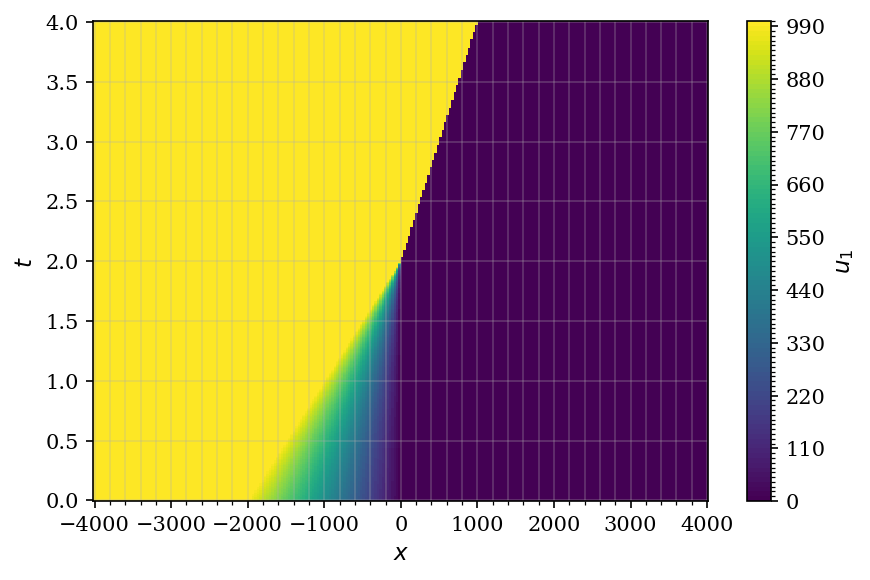

In [11]:
visualize_pde_1d(u, t_grid, x_grid)

## Kuramato-Sivashinsky PDE

The Kuramato-Sivashinsky equation was first derived independently by [(Kuramato, 1978)](https://academic.oup.com/ptps/article/doi/10.1143/PTPS.64.346/1871466) and [(Michelson and Sivashinsky, 1977)](https://www.sciencedirect.com/science/article/pii/0094576577900972) from chaotic behaviours observed in diffusion-reaction systems and laminar flame fronts respectively. It is defined as

$$ \frac{\partial u}{\partial t} + u \frac{\partial u}{dx} + \frac{\partial^2 u}{dx^2} + \frac{\partial^4 u}{dx^4}= 0 $$

The solution is solved using an exponential time-differencing RK4 (ETDRK4) scheme described by [(Kassam and Trefethen, 2005)](https://epubs.siam.org/doi/10.1137/S1064827502410633).

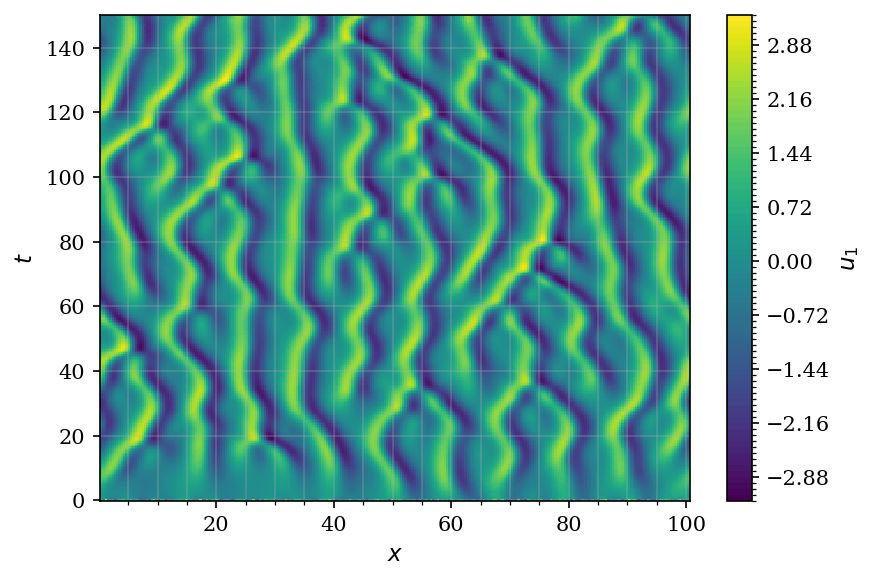

In [12]:
# Define time grid parameters
tFinal = 150
dt = 0.5

# Define spatial grid parameters
x_bounds = [0, 32*np.pi]
x_len = 256

# Define the initial condition
u0 = lambda x: np.random.normal(size=x.shape)

# Obtain solution
u, t_grid, x_grid = kuramato_sivashinsky(tFinal, dt, x_len, x_bounds, u0)

# Visualize the solution
visualize_pde_1d(u, t_grid, x_grid)

The solution is periodic along its spatial dimension and will typically always enter its chaotic attractor state if given suitable initial conditions.

## Korteweg de Vries PDE

The Korteweg de Vries PDE is defined as

$$ \frac{\partial u}{\partial t} + u \frac{\partial u}{dx} + \frac{\partial^3 u}{dx^3} = 0 $$

and models unidirectional soliton waves observed in shallow water. We also employ an ETDRK4 scheme to solve the equation on a periodic spatial domain.

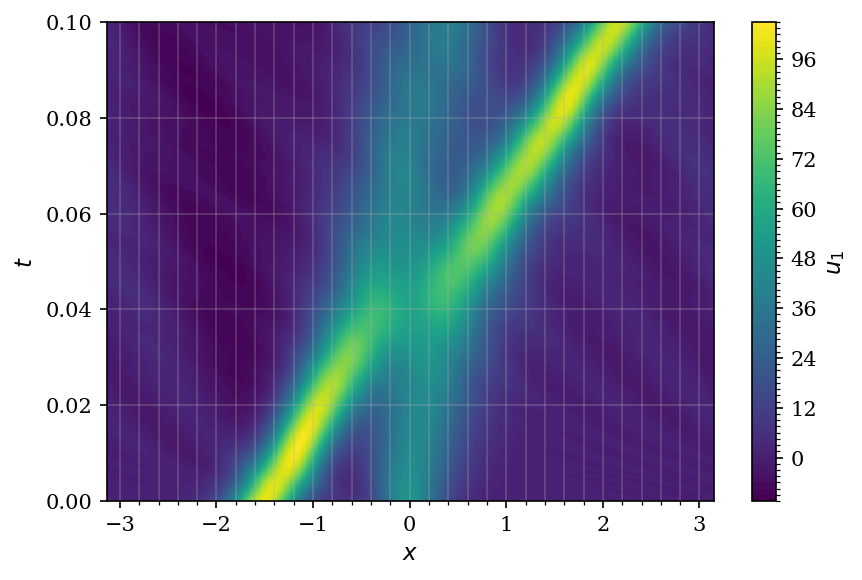

In [13]:
# Define time grid parameters
tFinal = 0.1
dt = 1e-5

# Define spatial grid parameters
x_bounds = [-np.pi, np.pi]
x_len = 500

# Define the initial condition
u0 = lambda x: 50/np.cosh(3*x)**2 + 100/np.cosh(3*(x+1.5))**2

# Obtain solution
u, t_grid, x_grid = korteweg_de_vries(tFinal, dt, x_len, x_bounds, u0)

# Visualize the solution
visualize_pde_1d(u, t_grid, x_grid)

## 2D Reaction-Diffusion Equations

The reaction-diffusion systems describe several physical phenomena that exhibits chemical reactions where multiple substances transmutate into one another and diffusion which results in the spreading of substance. In its general form, a 2D reaction-diffusion system for two component system is modelled as

$$
\begin{aligned}
    \frac{\partial u}{\partial t} &= \alpha \left( \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} \right) + F(u,v), \\
    \frac{\partial v}{\partial t} &= \alpha \left( \frac{\partial^2 v}{\partial x^2} + \frac{\partial^2 v}{\partial y^2} \right) + G(u,v),
\end{aligned}
$$

where $F(u,v)$ and $G(u,v)$ are functions modelling the chemical reactions. Following [(Messenger and Bortz, 2021)](https://www.sciencedirect.com/science/article/pii/S0021999121004204), we define the diffusion coefficient $\alpha=0.1$ and

$$
\begin{aligned}
    F(u,v) &= -uv^2 - u^3 + v^3 + u^2v + u, \\
    G(u,v) &= v - uv^2 - u^3 - v^3 - u^2v.
\end{aligned}
$$

We solve the equations on a periodic domain using 6th order finite difference scheme in space with a RK4 time integrator.

In [14]:
# Define time grid parameters
tFinal = 10
dt = 0.05

# Define spatial grid parameters
x_bounds = [-10, 10]
x_len = 100

# Define spatial grids
x_grids = [
    np.linspace(*x_bounds, x_len, endpoint=False),
    np.linspace(*x_bounds, x_len, endpoint=False)
]
[X, Y] = np.meshgrid(*x_grids, indexing='ij')

# Define initial conditions
u0 = np.stack((
    1/(1 + (5-np.sqrt(X**2 + Y**2))**2),
    np.zeros(X.shape)
), axis=-1)

# Obtain solution
t_grid, u = rk4(
    reaction_diffusion_2d,
    tFinal, u0, dt,
    (x_grids,)
)

We may proceed to visualize the solution with `visualize_pde_2d` which displays an animated plot for each variable in the PDE across time within its 2D spatial domain.

In [15]:
# Visualize the solution
visualize_pde_2d(u, t_grid, x_grids, equal_axis=True)

## Shallow-Water Equations

The 2D shallow water equations are derived from the Navier-Stokes equation to model the surface height of shallow waters where the horizontal length scales are much greater than the vertical scales. In its conservative form, it is defined by

$$
\begin{align}
0 &= \frac{\partial}{\partial t}(hu) + \frac{\partial}{\partial x}(hu^2 + \frac{1}{2}gh^2) + \frac{\partial}{\partial y}(huv) \\
0 &= \frac{\partial}{\partial t}(hv) + \frac{\partial}{\partial y}(hv^2 + \frac{1}{2}gh^2) + \frac{\partial}{\partial x}(huv) \\
0 &= \frac{\partial}{\partial t}(h) + \frac{\partial}{\partial x}(hu) + \frac{\partial}{\partial y}(hv)
\end{align}
$$

We shall also solve this equation on a periodic boundary condition with 6th order finite difference in space with RK4 time integration.

In [16]:
# Define time grid parameters
tFinal = 20
dt = 0.1

# Define spatial grid parameters
x_bounds = [-50, 50]
x_len = 81

# Define spatial grids
x_grids = [
    np.linspace(*x_bounds, x_len, endpoint=False),
    np.linspace(*x_bounds, x_len, endpoint=False)
]
[X, Y] = np.meshgrid(*x_grids, indexing='ij')

# Define initial conditions
u0 = np.stack((
    np.zeros(X.shape),
    np.zeros(X.shape),
    np.exp(-(X**2+Y**2)/25) + 10
), axis=-1)

# Obtain solution
t_grid, u = rk4(
    shallow_water,
    tFinal, u0, dt,
    (x_grids,)
)

Let us visualize all 3 states of horizontal velocity, vertical velocity and wave height.

In [17]:
# Visualize the solution
visualize_pde_2d(u, t_grid, x_grids, equal_axis=True, frame_interval=10)